## This is to test your knowledge on NLP

Building a machine learning model with the provided dataset to classify the news category or topic. 

In [183]:
# Built-in library
import itertools
import re
from typing import Any, Optional, Sequence, Union
import warnings
warnings.filterwarnings('ignore')

# Standard imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_recall_curve, auc
from sklearn.feature_selection import f_classif
from sklearn import pipeline
from sklearn import datasets
from sklearn.model_selection import validation_curve

#import of packages
from sklearn import tree
from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.linear_model import SGDClassifier
import tensorflow as tf
from tensorflow import keras

#checking for the accuracy score , precision score, ... of multinomial naive bayes model
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, precision_recall_curve

# pandas settings
pd.options.display.max_rows = 1_000
pd.options.display.max_columns = 1_000
pd.options.display.max_colwidth = 1_000




# Black code formatter (Optional)
#%load_ext lab_black

In [5]:
#loading dataset
df = pd.read_csv("bbc-text.csv")

print(df.shape)

df.head(50)

(2225, 2)


,category,text
0,tech,tv future in the hands of viewers with home theatre systems plasma high-definition tvs and digital video recorders moving into the living room the way people watch tv will be radically different in five years time. that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes. with the us leading the trend programmes and other content will be delivered to viewers via home networks through cable satellite telecoms companies and broadband service providers to front rooms and portable devices. one of the most talked-about technologies of ces has been digital and personal video recorders (dvr and pvr). these set-top boxes like the us s tivo and the uk s sky+ system allow people to record store play pause and forward wind tv programmes when they want. essentially the technology allows for much more personalised tv. they are also being built-in to h...
1,business,worldcom boss left books alone former worldcom boss bernie ebbers who is accused of overseeing an $11bn (£5.8bn) fraud never made accounting decisions a witness has told jurors. david myers made the comments under questioning by defence lawyers who have been arguing that mr ebbers was not responsible for worldcom s problems. the phone company collapsed in 2002 and prosecutors claim that losses were hidden to protect the firm s shares. mr myers has already pleaded guilty to fraud and is assisting prosecutors. on monday defence lawyer reid weingarten tried to distance his client from the allegations. during cross examination he asked mr myers if he ever knew mr ebbers make an accounting decision . not that i am aware of mr myers replied. did you ever know mr ebbers to make an accounting entry into worldcom books mr weingarten pressed. no replied the witness. mr myers has admitted that he ordered false accounting entries at the request of former worldcom chief fina...
2,sport,tigers wary of farrell gamble leicester say they will not be rushed into making a bid for andy farrell should the great britain rugby league captain decide to switch codes. we and anybody else involved in the process are still some way away from going to the next stage tigers boss john wells told bbc radio leicester. at the moment there are still a lot of unknowns about andy farrell not least his medical situation. whoever does take him on is going to take a big big gamble. farrell who has had persistent knee problems had an operation on his knee five weeks ago and is expected to be out for another three months. leicester and saracens are believed to head the list of rugby union clubs interested in signing farrell if he decides to move to the 15-man game. if he does move across to union wells believes he would better off playing in the backs at least initially. i m sure he could make the step between league and union by being involved in the centre said wells. ...
3,sport,yeading face newcastle in fa cup premiership side newcastle united face a trip to ryman premier league leaders yeading in the fa cup third round. the game - arguably the highlight of the draw - is a potential money-spinner for non-league yeading who beat slough in the second round. conference side exeter city who knocked out doncaster on saturday will travel to old trafford to meet holders manchester united in january. arsenal were drawn at home to stoke and chelsea will play host to scunthorpe. the only other non-league side in the draw are hinckley united who held brentford to a goalless draw on sunday. they will meet league one leaders luton if they win their replay against martin allen s team at griffin park. a number of premiership teams face difficult away games against championship sides on the weekend of 8/9 january. third-placed everton visit plymouth liverpool travel to burnley crystal palace go to sunderland fulham face carling cup semi-finalists watford bolton...
4,entertainment,ocea

## EXPLORATORY DATA ANALYSIS

In [7]:
#checking the columns
df.columns

Index(['category', 'text'], dtype='object')

In [8]:
#checking for the type of data 
df.dtypes

category    object
text        object
dtype: object

In [56]:
df.describe()

,category,text
count,2225,2225
unique,5,2126
top,sport,kennedy questions trust of blair lib dem leader charles kennedy has said voters now have a fundamental lack of trust of tony blair as prime minister. he said backing his party was not a wasted vote adding that with the lib dems what you see is what you get . he made his comments at the start of a day of appearances on channel five in a session on the wright stuff programme. questions from callers a studio audience and the show s presenter covered lib dem tax plans anti-terror laws and immigration. mr kennedy said during his nearly 22 years in parliament he had seen prime ministers and party leaders come and go and knew the pitfalls of british politics. 1983 was when i was first elected as an mp - so tony blair michael howard and myself were all class of 83 - and over that nearly quarter of a century the world has changed out of recognition he said. we don t actually hear the argument any longer: lib dems good people reasonable ideas but only if we thought they coul...
freq,511,2


In [9]:
#checking for the  number of each unique features
df.nunique()

category       5
text        2126
dtype: int64

In [22]:
df["category"].unique()

array(['tech', 'business', 'sport', 'entertainment', 'politics'],
      dtype=object)

In [10]:
#checking for missing variables
df.isna().sum()

category    0
text        0
dtype: int64

In [11]:
#checking if any of our data is duplicated in the dataset
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2220    False
2221    False
2222    False
2223    False
2224    False
Length: 2225, dtype: bool

In [12]:
df.loc[df.duplicated()]

,category,text
85,politics,hague given up his pm ambition former conservative leader william hague says he will not stand for the leadership again having given up his ambition to be prime minister. mr hague 43 told the daily telegraph he would now find a life dominated by politics too boring and unfulfilling. mr hague who stepped down after his party s 2001 election defeat does not rule out a return to the front bench. he also told the paper he hopes to remain mp for richmond north yorks and start a family with wife ffion. mr hague who recently had published the biography of william pitt the younger also said he wanted to continue writing books and speech-writing. he told the newspaper: i don t know whether i will ever go back on to the front but don t rush me. asked if he would stand for the leadership again mr hague replied: no. definitely not. his determination to stay away from a central role will disappoint some senior conservative members who say the party needs him. tim collins ...
301,politics,fox attacks blair s tory lies tony blair lied when he took the uk to war so has no qualms about lying in the election campaign say the tories. tory co-chairman liam fox was speaking after mr blair told labour members the tories offered a hard right agenda . dr fox told bbc radio: if you are willing to lie about the reasons for going to war i guess you are going to lie about anything at all. he would not discuss reports the party repaid £500 000 to lord ashcroft after he predicted an election defeat. the prime minister ratcheted up labour s pre-election campaigning at the weekend with a helicopter tour of the country and his speech at the party s spring conference. he insisted he did not know the poll date but it is widely expected to be 5 may. in what was seen as a highly personal speech in gateshead on sunday mr blair said: i have the same passion and hunger as when i first walked through the door of 10 downing street. he described his relationship with the public as...
496,tech,microsoft gets the blogging bug software giant microsoft is taking the plunge into the world of blogging. it is launching a test service to allow people to publish blogs or online journals called msn spaces. microsoft is trailing behind competitors like google and aol which already offer services which make it easy for people to set up web journals. blogs short for web logs have become a popular way for people to talk about their lives and express opinions online. msn spaces is free to anyone with a hotmail or msn messenger account. people will be able to choose a layout for the page upload images and share photo albums and music playlists. the service will be supported by banner ads. this is a simple tool for people to express themselves said msn s blake irving. this is microsoft s first foray into blogging which has taken off as a web phenomenon in the past year. competitors like google already offer free services through its blogger site while aol provides its membe...
543,business,economy strong in election year uk businesses are set to prosper during the next few months - but this could trigger more interest rate rises according to a report. optimism is at its highest since 1997 and business will reap the benefits of a continuing rise in public spending say researchers at bdo stoy hayward. the bank of england is expected to keep rates on hold this week - but they could go up later in the year. rates are likely to rise after the anticipated general election in may. the bdo optimism index - a leading indicator of gdp growth two quarters ahead edged up in january to 102.5 from 102.2 in october. the rise is due in part to an increase in public spending and increased merger and acquisition activity. the only thing blighting business optimism this year will be uncertainties associated with the general election bdo said. its bdo s output index - which predicts gdp movements a quarter in advance - remained at 100.8 for january implying gdp growth at 2.9%...

In [13]:
#checking the shape of the duplicates
df.loc[df.duplicated()].shape

(99, 2)

In [26]:
#checking for the duplicates in the Text for complete similiarity
df.query('text == "hague  given up  his pm ambition former conservative leader william hague says he will not stand for the leadership again  having given up his ambition to be prime minister.  mr hague  43  told the daily telegraph he would now find a life dominated by politics too  boring  and unfulfilling. mr hague  who stepped down after his party s 2001 election defeat  does not rule out a return to the front bench. he also told the paper he hopes to remain mp for richmond  north yorks  and start a family with wife ffion. mr hague  who recently had published the biography of william pitt the younger  also said he wanted to continue writing books and speech-writing.  he told the newspaper:  i don t know whether i will ever go back on to the front  but don t rush me.  asked if he would stand for the leadership again  mr hague replied:  no. definitely not.  his determination to stay away from a central role will disappoint some senior conservative members  who say the party needs him. tim collins  the shadow education secretary  said last week it would be a  huge boost  to the party if mr hague returned to the front bench. mr hague became an mp at 27 and leader of the opposition at 36. he said:  i feel fortunate that  by the age of 40  i had crammed in an entire political career.  i had been in the cabinet and been leader of the party  so now i can branch out into other things...it is a very liberating feeling.  mr hague added that he may have misjudged his own ambition to be prime minister.  maybe i wasn t as driven by politics as i thought i was   he said."')

,category,text
13,politics,hague given up his pm ambition former conservative leader william hague says he will not stand for the leadership again having given up his ambition to be prime minister. mr hague 43 told the daily telegraph he would now find a life dominated by politics too boring and unfulfilling. mr hague who stepped down after his party s 2001 election defeat does not rule out a return to the front bench. he also told the paper he hopes to remain mp for richmond north yorks and start a family with wife ffion. mr hague who recently had published the biography of william pitt the younger also said he wanted to continue writing books and speech-writing. he told the newspaper: i don t know whether i will ever go back on to the front but don t rush me. asked if he would stand for the leadership again mr hague replied: no. definitely not. his determination to stay away from a central role will disappoint some senior conservative members who say the party needs him. tim collins ...
85,politics,hague given up his pm ambition former conservative leader william hague says he will not stand for the leadership again having given up his ambition to be prime minister. mr hague 43 told the daily telegraph he would now find a life dominated by politics too boring and unfulfilling. mr hague who stepped down after his party s 2001 election defeat does not rule out a return to the front bench. he also told the paper he hopes to remain mp for richmond north yorks and start a family with wife ffion. mr hague who recently had published the biography of william pitt the younger also said he wanted to continue writing books and speech-writing. he told the newspaper: i don t know whether i will ever go back on to the front but don t rush me. asked if he would stand for the leadership again mr hague replied: no. definitely not. his determination to stay away from a central role will disappoint some senior conservative members who say the party needs him. tim collins ...


In [27]:
#checking for the duplicates in the Text for complete similiarity
df.query('text == "fox attacks blair s tory  lies  tony blair lied when he took the uk to war so has no qualms about lying in the election campaign  say the tories.  tory co-chairman liam fox was speaking after mr blair told labour members the tories offered a  hard right agenda . dr fox told bbc radio:  if you are willing to lie about the reasons for going to war  i guess you are going to lie about anything at all.  he would not discuss reports the party repaid £500 000 to lord ashcroft after he predicted an election defeat.  the prime minister ratcheted up labour s pre-election campaigning at the weekend with a helicopter tour of the country and his speech at the party s spring conference. he insisted he did not know the poll date  but it is widely expected to be 5 may.  in what was seen as a highly personal speech in gateshead on sunday  mr blair said:  i have the same passion and hunger as when i first walked through the door of 10 downing street.  he described his relationship with the public as starting euphoric  then struggling to live up to the expectations  and reaching the point of raised voices and  throwing crockery . he warned his supporters against complacency  saying:  it s a fight for the future of our country  it s a fight that for britain and the people of britain we have to win.   mr blair said that whether the public chose michael howard or mr kennedy  it would result in  a tory government not a labour government and a country that goes back and does not move forward . dr fox accused mr blair and other cabinet ministers of telling lies about their opponents  policies and then attacking the lies.  what we learned at the weekend is what labour tactics are going to be and it s going to be fear and smear   he told bbc news. the tory co-chairman attacked labour s six new pledges as  vacuous  and said mr blair was very worried voters would take revenge for his failure to deliver. dr fox refused to discuss weekend newspaper reports that the party had repaid £500 000 to former tory treasurer lord ashcroft after he said the party could not win the election.  we repay loans when they are due but do not comment to individual financial matters   he said  insisting he enjoyed a  warm and constructive  relationship to lord ashcroft.  meanwhile lib dem leader charles kennedy is expected to attack mr blair s words as he begins a nationwide tour on monday. mr kennedy is accelerating lib dem election preparations this week as he visits manchester  liverpool  leicester  somerset  basingstoke  shrewsbury  dorset and torbay. he said:  this is three-party politics. in the northern cities  the contest is between labour and the liberal democrats.  in southern and rural seats - especially in the south west - the principal contenders are the liberal democrats and the conservatives  who are out of the running in scotland and wales.  the lib dems accuse mr blair of making a  touchy-feely  speech to labour delegates which will not help him regain public trust."')

,category,text
170,politics,fox attacks blair s tory lies tony blair lied when he took the uk to war so has no qualms about lying in the election campaign say the tories. tory co-chairman liam fox was speaking after mr blair told labour members the tories offered a hard right agenda . dr fox told bbc radio: if you are willing to lie about the reasons for going to war i guess you are going to lie about anything at all. he would not discuss reports the party repaid £500 000 to lord ashcroft after he predicted an election defeat. the prime minister ratcheted up labour s pre-election campaigning at the weekend with a helicopter tour of the country and his speech at the party s spring conference. he insisted he did not know the poll date but it is widely expected to be 5 may. in what was seen as a highly personal speech in gateshead on sunday mr blair said: i have the same passion and hunger as when i first walked through the door of 10 downing street. he described his relationship with the public as...
301,politics,fox attacks blair s tory lies tony blair lied when he took the uk to war so has no qualms about lying in the election campaign say the tories. tory co-chairman liam fox was speaking after mr blair told labour members the tories offered a hard right agenda . dr fox told bbc radio: if you are willing to lie about the reasons for going to war i guess you are going to lie about anything at all. he would not discuss reports the party repaid £500 000 to lord ashcroft after he predicted an election defeat. the prime minister ratcheted up labour s pre-election campaigning at the weekend with a helicopter tour of the country and his speech at the party s spring conference. he insisted he did not know the poll date but it is widely expected to be 5 may. in what was seen as a highly personal speech in gateshead on sunday mr blair said: i have the same passion and hunger as when i first walked through the door of 10 downing street. he described his relationship with the public as...


In [28]:
#checking for the dataset without duplicates, renaming it and resetting index
df_1 = df.loc[~df.duplicated()].reset_index(drop=True).copy()

**inference: from the code above,it is noted that we have 99 duplicted data rows in our dataset. the text were checked in order to cross check if the duplicates were complete duplicates across all columns or just across some columns.its was noticed that they were complete duplicates across all columns, hence the duplicates were dropped and a new dataframe containing datasets without duplicates was created.**


In [29]:
#checking the new dataframe
df_1

,category,text
0,tech,tv future in the hands of viewers with home theatre systems plasma high-definition tvs and digital video recorders moving into the living room the way people watch tv will be radically different in five years time. that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes. with the us leading the trend programmes and other content will be delivered to viewers via home networks through cable satellite telecoms companies and broadband service providers to front rooms and portable devices. one of the most talked-about technologies of ces has been digital and personal video recorders (dvr and pvr). these set-top boxes like the us s tivo and the uk s sky+ system allow people to record store play pause and forward wind tv programmes when they want. essentially the technology allows for much more personalised tv. they are also being built-in to h...
1,business,worldcom boss left books alone former worldcom boss bernie ebbers who is accused of overseeing an $11bn (£5.8bn) fraud never made accounting decisions a witness has told jurors. david myers made the comments under questioning by defence lawyers who have been arguing that mr ebbers was not responsible for worldcom s problems. the phone company collapsed in 2002 and prosecutors claim that losses were hidden to protect the firm s shares. mr myers has already pleaded guilty to fraud and is assisting prosecutors. on monday defence lawyer reid weingarten tried to distance his client from the allegations. during cross examination he asked mr myers if he ever knew mr ebbers make an accounting decision . not that i am aware of mr myers replied. did you ever know mr ebbers to make an accounting entry into worldcom books mr weingarten pressed. no replied the witness. mr myers has admitted that he ordered false accounting entries at the request of former worldcom chief fina...
2,sport,tigers wary of farrell gamble leicester say they will not be rushed into making a bid for andy farrell should the great britain rugby league captain decide to switch codes. we and anybody else involved in the process are still some way away from going to the next stage tigers boss john wells told bbc radio leicester. at the moment there are still a lot of unknowns about andy farrell not least his medical situation. whoever does take him on is going to take a big big gamble. farrell who has had persistent knee problems had an operation on his knee five weeks ago and is expected to be out for another three months. leicester and saracens are believed to head the list of rugby union clubs interested in signing farrell if he decides to move to the 15-man game. if he does move across to union wells believes he would better off playing in the backs at least initially. i m sure he could make the step between league and union by being involved in the centre said wells. ...
3,sport,yeading face newcastle in fa cup premiership side newcastle united face a trip to ryman premier league leaders yeading in the fa cup third round. the game - arguably the highlight of the draw - is a potential money-spinner for non-league yeading who beat slough in the second round. conference side exeter city who knocked out doncaster on saturday will travel to old trafford to meet holders manchester united in january. arsenal were drawn at home to stoke and chelsea will play host to scunthorpe. the only other non-league side in the draw are hinckley united who held brentford to a goalless draw on sunday. they will meet league one leaders luton if they win their replay against martin allen s team at griffin park. a number of premiership teams face difficult away games against championship sides on the weekend of 8/9 january. third-placed everton visit plymouth liverpool travel to burnley crystal palace go to sunderland fulham face carling cup semi-finalists watford bolton...
4,entertainment,ocea

In [30]:
#checking for the shape of the new dataset
df_1.shape

(2126, 2)

In [32]:
# Split the data into numeric and categorical data
num_data = df_1.select_dtypes(include=[int, float])
cat_data = df_1.select_dtypes(exclude=[int, float])

# Check the shape of the data
num_data.shape, cat_data.shape

#it is noticed from the code above that the data sets are only categorical data and none is numerical

((2126, 0), (2126, 2))

In [34]:
#checking for unique labels of each categorical columns
for col in cat_data:
    print(col, ': ', len(cat_data[col].unique()), 'labels')

category :  5 labels
text :  2126 labels


In [35]:
#checking the value count of the category
df_1['category'].value_counts()

sport            504
business         503
politics         403
entertainment    369
tech             347
Name: category, dtype: int64

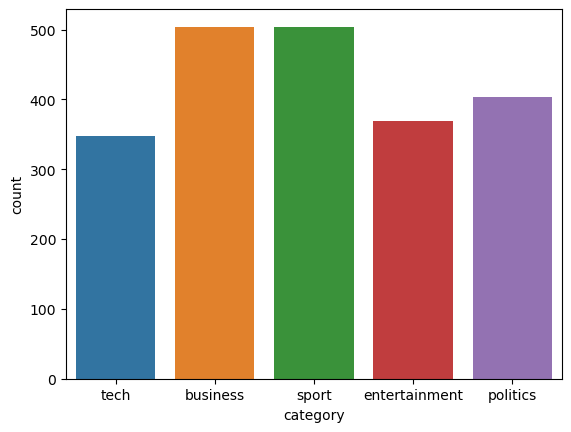

In [63]:
sns.countplot(df_1.category)
plt.show()

In [36]:
#checking the value count of the text
df_1['text'].value_counts()

tv future in the hands of viewers with home theatre systems  plasma high-definition tvs  and digital video recorders moving into the living room  the way people watch tv will be radically different in five years  time.  that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes. with the us leading the trend  programmes and other content will be delivered to viewers via home networks  through cable  satellite  telecoms companies  and broadband service providers to front rooms and portable devices.  one of the most talked-about technologies of ces has been digital and personal video recorders (dvr and pvr). these set-top boxes  like the us s tivo and the uk s sky+ system  allow people to record  store  play  pause and forward wind tv programmes when they want.  essentially  the technology allows for much more personalised tv. they are also being built-in to high-

In [37]:
df_1['text']

0       tv future in the hands of viewers with home theatre systems  plasma high-definition tvs  and digital video recorders moving into the living room  the way people watch tv will be radically different in five years  time.  that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes. with the us leading the trend  programmes and other content will be delivered to viewers via home networks  through cable  satellite  telecoms companies  and broadband service providers to front rooms and portable devices.  one of the most talked-about technologies of ces has been digital and personal video recorders (dvr and pvr). these set-top boxes  like the us s tivo and the uk s sky+ system  allow people to record  store  play  pause and forward wind tv programmes when they want.  essentially  the technology allows for much more personalised tv. they are also being built-in 

**inference: it is noticed that the sport and business news categories are the highest while tech news is the lowest, meaning we have more news on sport and business and the least news on tech**

## DATA CLEANING AND PREPROCESSING

In [39]:
#importing required libraries
from wordcloud import WordCloud, STOPWORDS
import sys, os

In [40]:
#checking stopwords
stopwords = STOPWORDS
print(stopwords)
print(len(stopwords))

{"hasn't", 'until', "how's", "i'll", 'very', 'all', 'down', 'i', 'yourself', "here's", 'should', 'were', "she'd", 'few', 'some', 'up', 'also', 'again', 'being', "you'll", 'does', "hadn't", "where's", "they're", "shan't", 'for', 'therefore', 'him', "won't", 'or', 'its', 'but', 'www', 'can', 'could', 'there', 'itself', 'which', 'why', "there's", "they'll", 'who', "wouldn't", 'been', 'then', 'my', 'these', 'this', "you're", "we'll", 'himself', 'between', "don't", "wasn't", 'through', "when's", 'themselves', 'because', 'since', "that's", 'to', 'are', 'and', 'yourselves', 'had', 'most', 'theirs', 'ever', 'your', 'our', 'against', "i'd", "weren't", 'during', 'did', "didn't", 'if', 'ours', 'only', 'shall', 'in', 'below', 'what', "isn't", 'myself', 'she', 'so', 'how', 'their', 'them', 'has', 'off', 'otherwise', 'ourselves', 'doing', 'would', 'as', "what's", 'me', 'get', "haven't", 'no', "why's", 'not', 'was', 'the', 'com', 'he', 'her', 'each', "we've", 'here', 'do', "couldn't", "let's", 'once'

In [42]:
new_text = " ".join(cat for cat in df_1.text)
new_text

'tv future in the hands of viewers with home theatre systems  plasma high-definition tvs  and digital video recorders moving into the living room  the way people watch tv will be radically different in five years  time.  that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes. with the us leading the trend  programmes and other content will be delivered to viewers via home networks  through cable  satellite  telecoms companies  and broadband service providers to front rooms and portable devices.  one of the most talked-about technologies of ces has been digital and personal video recorders (dvr and pvr). these set-top boxes  like the us s tivo and the uk s sky+ system  allow people to record  store  play  pause and forward wind tv programmes when they want.  essentially  the technology allows for much more personalised tv. they are also being built-in to high

In [43]:
#converting every word in new_text to lower case
lower_case_text=new_text.lower()
lower_case_text

'tv future in the hands of viewers with home theatre systems  plasma high-definition tvs  and digital video recorders moving into the living room  the way people watch tv will be radically different in five years  time.  that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes. with the us leading the trend  programmes and other content will be delivered to viewers via home networks  through cable  satellite  telecoms companies  and broadband service providers to front rooms and portable devices.  one of the most talked-about technologies of ces has been digital and personal video recorders (dvr and pvr). these set-top boxes  like the us s tivo and the uk s sky+ system  allow people to record  store  play  pause and forward wind tv programmes when they want.  essentially  the technology allows for much more personalised tv. they are also being built-in to high

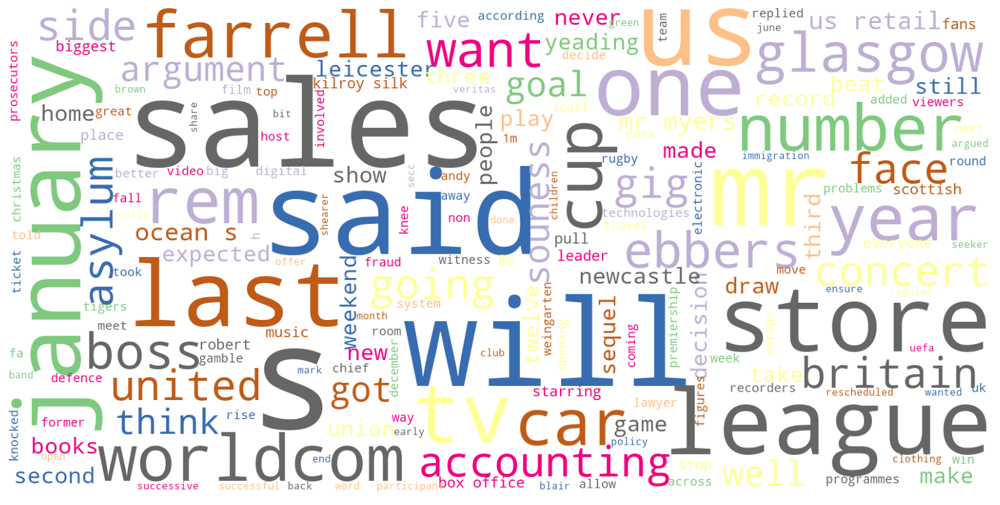

In [57]:
#generating the wordcloud in order to identify the most frequents words in the text
def mywordcloud (lower_case_text, title =None):
    wordcloud = WordCloud(
    background_color ='white',
    colormap = 'Accent_r',
    stopwords=stopwords,
    max_words= 450,
    max_font_size=60,
    scale=4,
    random_state= 1
    ).generate(str(lower_case_text))
    
    fig= plt.figure(1, figsize=(20,20))
    plt.axis('off')
    if title:
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top =2.3)
#displaying the wordcloud        
    plt.imshow(wordcloud)
    plt.show()
    
mywordcloud(df_1["text"].dropna())

In [44]:
#checking for punctuations inorder to identify the punctuations to be removed
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [45]:
#cleaning the text in order to remove all the punctuations
cleaned_text= lower_case_text.translate(str.maketrans("","",string.punctuation))
cleaned_text

'tv future in the hands of viewers with home theatre systems  plasma highdefinition tvs  and digital video recorders moving into the living room  the way people watch tv will be radically different in five years  time  that is according to an expert panel which gathered at the annual consumer electronics show in las vegas to discuss how these new technologies will impact one of our favourite pastimes with the us leading the trend  programmes and other content will be delivered to viewers via home networks  through cable  satellite  telecoms companies  and broadband service providers to front rooms and portable devices  one of the most talkedabout technologies of ces has been digital and personal video recorders dvr and pvr these settop boxes  like the us s tivo and the uk s sky system  allow people to record  store  play  pause and forward wind tv programmes when they want  essentially  the technology allows for much more personalised tv they are also being builtin to highdefinition tv

In [46]:
#tokenizing the words in order to split them into single words.
tokenized_words= cleaned_text.split()
tokenized_words

['tv',
 'future',
 'in',
 'the',
 'hands',
 'of',
 'viewers',
 'with',
 'home',
 'theatre',
 'systems',
 'plasma',
 'highdefinition',
 'tvs',
 'and',
 'digital',
 'video',
 'recorders',
 'moving',
 'into',
 'the',
 'living',
 'room',
 'the',
 'way',
 'people',
 'watch',
 'tv',
 'will',
 'be',
 'radically',
 'different',
 'in',
 'five',
 'years',
 'time',
 'that',
 'is',
 'according',
 'to',
 'an',
 'expert',
 'panel',
 'which',
 'gathered',
 'at',
 'the',
 'annual',
 'consumer',
 'electronics',
 'show',
 'in',
 'las',
 'vegas',
 'to',
 'discuss',
 'how',
 'these',
 'new',
 'technologies',
 'will',
 'impact',
 'one',
 'of',
 'our',
 'favourite',
 'pastimes',
 'with',
 'the',
 'us',
 'leading',
 'the',
 'trend',
 'programmes',
 'and',
 'other',
 'content',
 'will',
 'be',
 'delivered',
 'to',
 'viewers',
 'via',
 'home',
 'networks',
 'through',
 'cable',
 'satellite',
 'telecoms',
 'companies',
 'and',
 'broadband',
 'service',
 'providers',
 'to',
 'front',
 'rooms',
 'and',
 'portable

In [47]:
#removing stopwords from the tokenized words and storing it in the new_words
new_words=[]

for word in tokenized_words:
    if word not in stopwords:
        new_words.append(word)
        
new_words

['tv',
 'future',
 'hands',
 'viewers',
 'home',
 'theatre',
 'systems',
 'plasma',
 'highdefinition',
 'tvs',
 'digital',
 'video',
 'recorders',
 'moving',
 'living',
 'room',
 'way',
 'people',
 'watch',
 'tv',
 'will',
 'radically',
 'different',
 'five',
 'years',
 'time',
 'according',
 'expert',
 'panel',
 'gathered',
 'annual',
 'consumer',
 'electronics',
 'show',
 'las',
 'vegas',
 'discuss',
 'new',
 'technologies',
 'will',
 'impact',
 'one',
 'favourite',
 'pastimes',
 'us',
 'leading',
 'trend',
 'programmes',
 'content',
 'will',
 'delivered',
 'viewers',
 'via',
 'home',
 'networks',
 'cable',
 'satellite',
 'telecoms',
 'companies',
 'broadband',
 'service',
 'providers',
 'front',
 'rooms',
 'portable',
 'devices',
 'one',
 'talkedabout',
 'technologies',
 'ces',
 'digital',
 'personal',
 'video',
 'recorders',
 'dvr',
 'pvr',
 'settop',
 'boxes',
 'us',
 's',
 'tivo',
 'uk',
 's',
 'sky',
 'system',
 'allow',
 'people',
 'record',
 'store',
 'play',
 'pause',
 'forwa

In [49]:
vect = CountVectorizer()
vect.fit(new_words)

CountVectorizer()

In [50]:
print("Vocabulary size: {}".format(len(vect.vocabulary_)))
print("Vocabulary content:\n {}".format(vect.vocabulary_))

Vocabulary size: 32602
Vocabulary content:
 {'tv': 30280, 'future': 13085, 'hands': 14209, 'viewers': 31288, 'home': 14907, 'theatre': 29359, 'systems': 28886, 'plasma': 22501, 'highdefinition': 14687, 'tvs': 30287, 'digital': 9634, 'video': 31269, 'recorders': 24217, 'moving': 19877, 'living': 17963, 'room': 25377, 'way': 31680, 'people': 22075, 'watch': 31646, 'will': 31997, 'radically': 23815, 'different': 9618, 'five': 12373, 'years': 32439, 'time': 29601, 'according': 2524, 'expert': 11634, 'panel': 21692, 'gathered': 13246, 'annual': 3462, 'consumer': 7988, 'electronics': 10777, 'show': 26776, 'las': 17393, 'vegas': 31143, 'discuss': 9809, 'new': 20377, 'technologies': 29136, 'impact': 15451, 'one': 21068, 'favourite': 12002, 'pastimes': 21868, 'us': 30962, 'leading': 17503, 'trend': 30048, 'programmes': 23311, 'content': 8022, 'delivered': 9223, 'via': 31224, 'networks': 20356, 'cable': 6129, 'satellite': 25789, 'telecoms': 29173, 'companies': 7607, 'broadband': 5773, 'service':

In [51]:
bag_of_words = vect.transform(new_words)

In [52]:
print(bag_of_words)

  (0, 30280)	1
  (1, 13085)	1
  (2, 14209)	1
  (3, 31288)	1
  (4, 14907)	1
  (5, 29359)	1
  (6, 28886)	1
  (7, 22501)	1
  (8, 14687)	1
  (9, 30287)	1
  (10, 9634)	1
  (11, 31269)	1
  (12, 24217)	1
  (13, 19877)	1
  (14, 17963)	1
  (15, 25377)	1
  (16, 31680)	1
  (17, 22075)	1
  (18, 31646)	1
  (19, 30280)	1
  (20, 31997)	1
  (21, 23815)	1
  (22, 9618)	1
  (23, 12373)	1
  (24, 32439)	1
  :	:
  (481251, 22870)	1
  (481252, 21586)	1
  (481253, 4702)	1
  (481254, 13604)	1
  (481255, 27511)	1
  (481256, 21623)	1
  (481257, 30067)	1
  (481258, 17448)	1
  (481259, 25264)	1
  (481260, 14475)	1
  (481261, 19917)	1
  (481262, 30716)	1
  (481264, 4055)	1
  (481265, 22519)	1
  (481266, 12332)	1
  (481267, 14108)	1
  (481268, 24074)	1
  (481269, 31788)	1
  (481270, 11423)	1
  (481271, 31565)	1
  (481272, 31947)	1
  (481273, 22526)	1
  (481274, 13085)	1
  (481275, 22552)	1
  (481276, 25653)	1


## FEATURE ENGINEERING AND MODEL SELECTION

In [258]:
#splitting the data set into train and test dataset
from sklearn.model_selection import train_test_split


TARGET =  df_1['category']
TEST_SIZE, RANDOM_STATE= 0.20, 123

x = df_1['text']
y= TARGET

x_train, x_validate, y_train, y_validate = train_test_split(
x,y, test_size = TEST_SIZE, random_state = RANDOM_STATE
)

x_train.shape, x_validate.shape

((1700,), (426,))

In [259]:
x_train.head()

708     fantasy book wins hollywood deal a british author has had the film rights to her children s bestseller snapped up for a seven-figure sum  with ridley scott set to direct.  michelle paver s wolf brother  a fantasy set 6 000 years ago  is the first in a planned series of six books. film studio fox has bought the rights for around $4m (£2.13m) for scott s company scott free to develop. the director said he was  thrilled  with the project.  wolf brother is an enchanting book   he said. paver  who lives in london and previously worked as a lawyer  began writing the book in 1982 while studying biochemistry at oxford university.  she was an established author of love stories when she turned the work-in-progress into a children s novel. it was published in 2004  with paver earning an advance of $5m (£2.8m) - the highest sum ever paid for a debut children s book. wolf brother tells the story of torak  a 12-year-old hunter who lives in the forest. after his father is killed he teams up w

In [262]:
# Preprocess the text
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB


vectorizer = CountVectorizer(stop_words="english")

# Count the words (vector of numbers!)
X_tr = vectorizer.fit_transform(x_train)
X_val = vectorizer.transform(x_validate)

X_tr  # Sparse matrix is used because most of the values in the vector are 0s

<1700x26547 sparse matrix of type '<class 'numpy.int64'>'
	with 245877 stored elements in Compressed Sparse Row format>

## BUILDING MACHINE LEARNING MODEL FOR PREDICTION
1. instantiate
2. fit(using training data)
3. make prediction (using test data)

In [305]:
models =[LogisticRegression(max_iter=1000), MultinomialNB()]

In [306]:
def compare_models_cross_validation():
    
    for model in models:
        
        cv_score = cross_val_score(model,X_tr, y_train, cv= 5)
        mean_accuracy = sum(cv_score)/len(cv_score)
        mean_accuracy = mean_accuracy*100
        mean_accuracy = round(mean_accuracy, 2)
        
        print('Cross Validation accuracies for the', model , '=', cv_score)
        print('Accuracy score of the ', model, '=', mean_accuracy, '%')
        print('---------------------------------------------------------------------------------')
        

In [307]:
compare_models_cross_validation()

Cross Validation accuracies for the LogisticRegression(max_iter=1000) = [0.95588235 0.96470588 0.96764706 0.97058824 0.97352941]
Accuracy score of the  LogisticRegression(max_iter=1000) = 96.65 %
---------------------------------------------------------------------------------
Cross Validation accuracies for the MultinomialNB() = [0.97058824 0.95588235 0.97941176 0.97352941 0.98529412]
Accuracy score of the  MultinomialNB() = 97.29 %
---------------------------------------------------------------------------------


In [263]:
#checking for the accuracy score , precision score, ... of multinomial naive bayes model
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, precision_recall_curve

In [264]:
metrics = pd.DataFrame(index = ['accuracy', 'precision', 'recall'],
                       columns = ['MultinomialNB'])

In [309]:
# using multinomial naive bayes
# Count the words (vector of numbers!)
X_tr = vectorizer.fit_transform(x_train)
X_val = vectorizer.transform(x_validate)
print(f"Shape X_train: {X_tr.shape}")

# instantiating the model
model = MultinomialNB()

#fitting the model
model.fit(X_tr, y_train)

#predict
y_pred= model.predict(X_val)

#y_pred= nb_model.predict_proba(X_val)


# Check the accuracy
train_accuracy = model.score(X_tr, y_train)
val_accuracy = model.score(X_val, y_validate)

print(f"Train accuracy: {train_accuracy:.3f}")
print(f"Test accuracy: {val_accuracy:.3f}")

#evaluate the model
y_pred_validate = model.predict(X_val)
metrics.loc['f1_score','MultinomialNB']= f1_score(y_pred = y_pred_validate, y_true = y_validate, average = 'micro' )
metrics.loc['precision','MultinomialNB'] = precision_score(y_pred = y_pred_validate, y_true = y_validate, average = 'micro')
metrics.loc['recall','MultinomialNB']=recall_score(y_pred = y_pred_validate, y_true = y_validate, average = 'micro')

 
metrics.loc['f1_score','MultinomialNB'], metrics.loc['precision','MultinomialNB'], metrics.loc['recall','MultinomialNB']

Shape X_train: (1700, 26547)
Train accuracy: 0.994
Test accuracy: 0.969


(0.9694835680751174, 0.9694835680751174, 0.9694835680751174)

<AxesSubplot:>

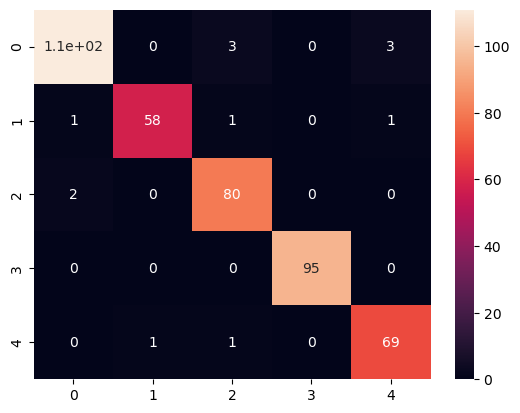

In [165]:
#confusionmatrix
conf_mat= metrics.confusion_matrix(y_validate, y_pred)
sns.heatmap(conf_mat, annot = True)

## USING MultinomialNB MODEL FOR PREDICTION

In [162]:
text = ['hague  given up  his pm ambition former conservative leader william hague says he will not stand for the leadership again  having given up his ambition to be prime minister.  mr hague  43  told the daily telegraph he would now find a life dominated by politics too  boring  and unfulfilling. mr hague  who stepped down after his party s 2001 election defeat  does not rule out a return to the front bench. he also told the paper he hopes to remain mp for richmond  north yorks  and start a family with wife ffion. mr hague  who recently had published the biography of william pitt the younger  also said he wanted to continue writing books and speech-writing.  he told the newspaper:  i don t know whether i will ever go back on to the front  but don t rush me.  asked if he would stand for the leadership again  mr hague replied:  no. definitely not.  his determination to stay away from a central role will disappoint some senior conservative members  who say the party needs him. tim collins  the shadow education secretary  said last week it would be a  huge boost  to the party if mr hague returned to the front bench. mr hague became an mp at 27 and leader of the opposition at 36. he said:  i feel fortunate that  by the age of 40  i had crammed in an entire political career.  i had been in the cabinet and been leader of the party  so now i can branch out into other things...it is a very liberating feeling.  mr hague added that he may have misjudged his own ambition to be prime minister.  maybe i wasn t as driven by politics as i thought i was   he said.']
X_val = vectorizer.transform(text).toarray()

prediction = nb_model.predict(X_val)
print(prediction)


['politics']


In [163]:
text = ['henman hopes ended in dubai third seed tim henman slumped to a straight sets defeat in his rain-interrupted dubai open quarter-final against ivan ljubicic.  the croatian eighth seed booked his place in the last four with a 7-5 6-4 victory over the british number one. henman had looked on course to level the match after going 2-0 up in the second set  but his progress was halted as the rain intervened again. ljubicic hit back after the break to seal a fourth straight win over henman. earlier in the day  spanish fifth seed tommy robredo secured his semi-final place when he beat nicolas kiefer of germany 6-4 6-4. afterwards  henman was left cursing the weather and the umpire after seven breaks for rain during the match.  it was incredibly frustrating   henman said.  it s raining and the umpire doesn t take control.  he kept telling us to play till the end of the game. but if it s raining  you come off - the score s irrelevant.  it couldn t be more frustrating as i was very happy with my form until now. you don t expect this in the desert.']
X_val = vectorizer.transform(text).toarray()

prediction = nb_model.predict(X_val)
print(prediction)

['sport']
